In [1]:
import time
import copy
import numpy as np
import pandas as pd
import seaborn as sn
from tqdm import tqdm
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

import sklearn
from sklearn.manifold import TSNE

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Function

from models import *
from utils import *
from datasets import *

In [2]:
import umap
import scipy

from umap.umap_ import nearest_neighbors, smooth_knn_dist, compute_membership_strengths


In [3]:
import torchvision as tv
import torchvision.transforms as transforms
from torch.autograd import Variable
from torchvision.utils import save_image

# Data Preprocessing

transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
trainTransform  = tv.transforms.Compose([tv.transforms.ToTensor(), tv.transforms.Normalize((0.1307,), (0.3081,))])
trainset = tv.datasets.MNIST(root='./data',  train=True, download=False, transform=transform)
testset = tv.datasets.MNIST(root='./data',  train=False, download=False, transform=transform)

# # sample
# idx = np.random.choice(np.arange(len(trainset)), size=10000)
# trainset = [trainset[i] for i in idx]
# idx = np.random.choice(np.arange(len(testset)), size=10000)
# testset = [testset[i] for i in idx]

traindata = [i[0].unsqueeze(0) for i in trainset]
trainlabel = [i[1] for i in trainset]
testdata = [i[0].unsqueeze(0) for i in testset]
testlabel = [i[1] for i in testset]

X_train = torch.vstack(traindata)
y_train = torch.tensor(trainlabel)
X_test = torch.vstack(testdata)
y_test = torch.tensor(testlabel)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

(torch.Size([60000, 1, 28, 28]),
 torch.Size([10000, 1, 28, 28]),
 torch.Size([60000]),
 torch.Size([10000]))

# check distribution of neighbour dists

In [16]:
import umap
from umap.umap_ import nearest_neighbors

# We compute the knn for max(n_neighbors)=250
mnist_knn = nearest_neighbors(X_train.view(-1,28*28),
                              n_neighbors=60,
                              metric="cosine",
                              metric_kwds=None,
                              angular=False,
                              random_state=None,
                             )
# mnist_knn: index, distance, a pynndescent object

In [17]:
mnist_knn[0].shape, mnist_knn[1].shape

((60000, 60), (60000, 60))

In [19]:
mnist_knn[1]

array([[0.        , 0.24837976, 0.24881174, ..., 0.31604991, 0.31633489,
        0.3164321 ],
       [0.        , 0.08514234, 0.09847123, ..., 0.15312581, 0.15344333,
        0.15372413],
       [0.        , 0.25624383, 0.26821505, ..., 0.44026944, 0.44111243,
        0.44187269],
       ...,
       [0.        , 0.13314865, 0.16097157, ..., 0.28586496, 0.28591287,
        0.28597881],
       [0.        , 0.15362526, 0.15851664, ..., 0.28893417, 0.2901141 ,
        0.29077336],
       [0.        , 0.09958271, 0.18665087, ..., 0.32914229, 0.33209262,
        0.33248082]])

In [15]:
idx_eu = mnist_knn[0]
dist_eu = mnist_knn[1]

In [20]:
idx_cos = mnist_knn[0]
dist_cos = mnist_knn[1]

In [23]:
idx_cos

array([[    0, 19825, 26251, ..., 23947, 24708, 10536],
       [    1,   639, 51121, ..., 40099, 14959,  8193],
       [    2, 54197, 20836, ...,   804, 39218, 28866],
       ...,
       [59997, 49032,  3188, ..., 33909, 20716,  4844],
       [59998, 29971, 57075, ..., 35219, 59924, 49403],
       [59999, 24241, 52171, ...,  8313, 14893, 14017]])

In [22]:
idx_eu

array([[    0, 32248,  8728, ...,  1978, 40546, 22322],
       [    1,   639, 51121, ..., 50151, 27583,  4931],
       [    2, 54197, 46128, ..., 20040,   682,  4758],
       ...,
       [59997, 49032,  3188, ..., 18103, 20716, 23630],
       [59998, 57075, 29971, ..., 57413, 45949,  6721],
       [59999, 24241, 52171, ..., 27731, 44351, 35591]])

In [25]:
idx_eu[0].shape

(60,)

In [26]:
len(np.intersect1d(idx_cos[0], idx_eu[0])), np.intersect1d(idx_cos[0], idx_eu[0])

(38,
 array([    0,  1482,  1634,  8728, 10536, 10740, 15378, 16017, 18123,
        18932, 19825, 20034, 22477, 23947, 24149, 24330, 24708, 26251,
        27378, 30483, 30489, 31379, 32248, 33825, 33909, 34557, 42338,
        44282, 46358, 47968, 50173, 52057, 52295, 52864, 53428, 53634,
        54159, 57528]))

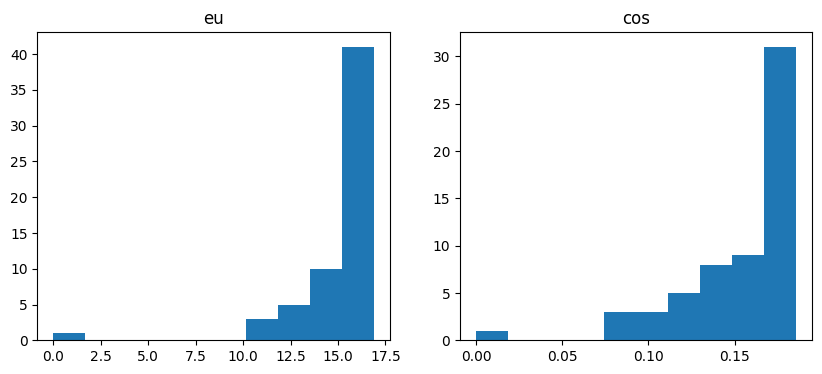

In [53]:
i = 123

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.title("eu")
plt.hist(dist_eu[i])
plt.subplot(1,2,2)
plt.title("cos")
plt.hist(dist_cos[i])
plt.show()

# embUMAP

In [168]:
reducer = umap.UMAP(n_neighbors=20, min_dist=0.1, precomputed_knn=mnist_knn, metric='euclidean')
emb = reducer.fit_transform(X_train.view(-1, 28*28))
emb.shape

(60000, 2)

In [177]:
draw_z(z=normalise(emb), cls=y_train, s=1)

<Figure size 15000x15000 with 0 Axes>

In [172]:
d0 = reducer.graph_[0,:].toarray()[reducer.graph_[0,:].toarray()!=0]
d0

array([0.05753416, 0.451564  , 0.03214416, 0.03947389, 0.41589987,
       0.32174164, 0.08698767, 0.28013685, 0.3946202 , 0.03887811,
       1.        , 0.3180229 , 0.25200626, 0.31120074, 0.03382517,
       0.04100911, 0.0983471 , 0.08387368, 0.06466983], dtype=float32)

In [175]:
inv_graph = reducer.graph_.copy()

inv_graph.data[inv_graph.data < inv_graph.data.max() / float(750)] = 0
inv_graph.eliminate_zeros()
inv_graph.data = inv_graph.data.min() / inv_graph.data
d1 = inv_graph[0,:].toarray()[inv_graph[0,:].toarray()!=0]
d1

array([0.02326568, 0.0029643 , 0.04164276, 0.0339103 , 0.00321849,
       0.00416039, 0.01538806, 0.00477828, 0.00339205, 0.03442996,
       0.00133857, 0.00420904, 0.00531166, 0.00430131, 0.03957323,
       0.03264084, 0.01361069, 0.01595937, 0.02069855], dtype=float32)

In [162]:
mnist_knn = nearest_neighbors(X_train.view(-1,28*28),
                              n_neighbors=20,
                              metric="euclidean",
                              metric_kwds=None,
                              angular=False,
                              random_state=None,
                             )
# mnist_knn: index, distance, a pynndescent object
mnist_knn[1][0]

array([ 0.      , 19.874786, 20.258274, 20.297958, 20.323292, 20.421776,
       20.427383, 20.437843, 20.488567, 20.539612, 20.99348 , 21.052683,
       21.070267, 21.195686, 21.25208 , 21.415398, 21.433802, 21.441137,
       21.508293, 21.53288 ], dtype=float32)

In [163]:
local_connectivity = 1.0
n_neighbors = 20
return_dists = False

knn_indices = np.float32(mnist_knn[0])
knn_dists = np.float32(mnist_knn[1].astype(float))


sigmas, rhos = smooth_knn_dist(
    knn_dists,
    float(n_neighbors),
    local_connectivity=float(local_connectivity),
)

rows, cols, vals, dists = compute_membership_strengths(
    knn_indices, knn_dists, sigmas, rhos, return_dists
)

result = scipy.sparse.coo_matrix(
    (vals, (rows, cols)), shape=(X_train.shape[0], X_train.shape[0])
)
result.eliminate_zeros()
x0 = result.tocsr()[0,:].toarray()
x0 = x0[x0!=0]
x0.shape

(19,)

In [174]:
x0

array([0.05753416, 0.451564  , 0.03214416, 0.03947389, 0.41589987,
       0.32174164, 0.08698767, 0.28013685, 0.3946202 , 0.03887811,
       1.        , 0.3180229 , 0.25200626, 0.31120074, 0.03382517,
       0.04100911, 0.0983471 , 0.08387368, 0.06466983], dtype=float32)

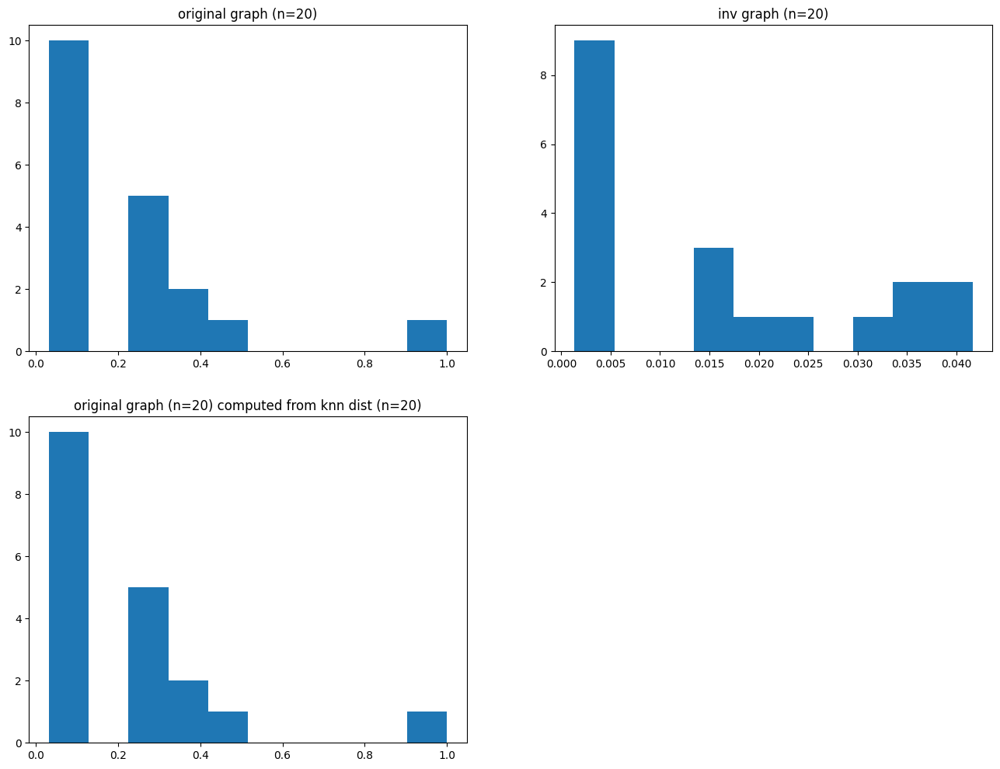

In [171]:
plt.figure(figsize=(16, 12))
plt.subplot(2,2,1)
plt.title("original graph (n=20)")
plt.hist(d0)
plt.subplot(2,2,2)
plt.title("inv graph (n=20)")
plt.hist(d1)
plt.subplot(2,2,3)
plt.title("original graph (n=20) computed from knn dist (n=20)")
plt.hist(x0)
plt.show()

# choose 20 neighbors out of 60

In [416]:
mnist_knn = nearest_neighbors(X_train.view(-1,28*28),
                              n_neighbors=60,
                              metric="euclidean",
                              metric_kwds=None,
                              angular=False,
                              random_state=None,
                             )
# mnist_knn: index, distance, a pynndescent object
mnist_knn[1][0]

array([ 0.      , 19.874786, 20.258274, 20.297958, 20.323292, 20.421776,
       20.427383, 20.437843, 20.488567, 20.539612, 20.99348 , 21.052683,
       21.070267, 21.195686, 21.25208 , 21.415398, 21.433802, 21.441137,
       21.508293, 21.53288 , 21.564774, 21.56558 , 21.57394 , 21.633335,
       21.664661, 21.66961 , 21.747189, 21.813318, 21.816093, 21.83107 ,
       21.881304, 21.954287, 21.968582, 22.043375, 22.05255 , 22.110851,
       22.177008, 22.178669, 22.19054 , 22.213373, 22.220053, 22.222754,
       22.266378, 22.292814, 22.298603, 22.344889, 22.428028, 22.477657,
       22.502823, 22.507519, 22.533743, 22.571642, 22.608805, 22.612577,
       22.62017 , 22.642735, 22.668638, 22.685658, 22.687466, 22.726658],
      dtype=float32)

In [417]:
# number of trees in random projection forest
n_trees = 5 + int(round((X_train.shape[0]) ** 0.5 / 20.0))
# max number of nearest neighbor iters to perform
n_iters = max(5, int(round(np.log2(X_train.shape[0]))))

# get nearest neighbors
nnd = NNDescent(
    X_train.reshape((len(X_train), np.product(np.shape(X_train)[1:]))),
    n_neighbors=60,
    metric='euclidean',
    n_trees=n_trees,
    n_iters=n_iters,
    max_candidates=60,
    verbose=True
)
# get indices and distances
knn_indices, knn_dists = nnd.neighbor_graph
# knn_indices.shape, knn_indices
knn_dists.shape, knn_dists

Mon Dec 11 22:26:08 2023 Building RP forest with 17 trees
Mon Dec 11 22:26:09 2023 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	Stopping threshold met -- exiting after 3 iterations


((60000, 60),
 array([[ 0.      , 19.874786, 20.258274, ..., 22.685658, 22.687466,
         22.726658],
        [ 0.      , 12.991039, 14.007796, ..., 17.334373, 17.341465,
         17.347107],
        [ 0.      , 17.534803, 19.615828, ..., 23.539122, 23.5535  ,
         23.557974],
        ...,
        [ 0.      , 13.395957, 14.25344 , ..., 19.934015, 19.939728,
         19.950495],
        [ 0.      , 14.054074, 14.52596 , ..., 20.257343, 20.327951,
         20.329489],
        [ 0.      , 13.2726  , 15.010933, ..., 21.5789  , 21.590788,
         21.604795]], dtype=float32))

In [457]:
mode = 2

# random
if mode==1:
    random_idx = np.random.choice(np.arange(60), size=20-1)

    knn_indices1 = np.hstack([mnist_knn[0][:, 0].reshape(-1,1), mnist_knn[0][:, sorted(random_idx)]])
    knn_dists1 = np.float32(np.hstack([mnist_knn[1][:, 0].reshape(-1,1), mnist_knn[1][:, sorted(random_idx)]]))

# furtherest
elif mode==2:

    random_idx = np.arange(60-20+1, 60)

    knn_indices1 = np.hstack([mnist_knn[0][:, 0].reshape(-1,1), mnist_knn[0][:, sorted(random_idx)]])
    knn_dists1 = np.float32(np.hstack([mnist_knn[1][:, 0].reshape(-1,1), mnist_knn[1][:, sorted(random_idx)]]))

else:
    pass

knn_dists1.shape, knn_dists1

((60000, 20),
 array([[ 0.      , 22.222754, 22.266378, ..., 22.685658, 22.687466,
         22.726658],
        [ 0.      , 16.919601, 16.985292, ..., 17.334373, 17.341465,
         17.347107],
        [ 0.      , 22.956106, 22.956264, ..., 23.539122, 23.5535  ,
         23.557974],
        ...,
        [ 0.      , 19.480091, 19.529997, ..., 19.934015, 19.939728,
         19.950495],
        [ 0.      , 19.675528, 19.707338, ..., 20.257343, 20.327951,
         20.329489],
        [ 0.      , 21.038319, 21.093046, ..., 21.5789  , 21.590788,
         21.604795]], dtype=float32))

In [458]:
umap_graph, sigmas, rhos = fuzzy_simplicial_set(
    X=X_train,
    n_neighbors=20,
    metric='euclidean',
    random_state=42,
    knn_indices=knn_indices1,
    knn_dists=knn_dists1.astype(np.float32, order='C'),
)

In [333]:
# local_connectivity = 1.0
# n_neighbors = 20
# return_dists = False

# # knn_indices = np.float32(mnist_knn[0])
# # knn_dists = np.float32(mnist_knn[1])

# random_idx = np.random.choice(np.arange(60), size=20-1)
# # knn_indices = np.float32(np.hstack([mnist_knn[0][:, 0].reshape(-1,1), mnist_knn[0][:, sorted(random_idx)]]))
# # knn_dists = np.float32(np.hstack([mnist_knn[1][:, 0].reshape(-1,1), mnist_knn[1][:, sorted(random_idx)]]))

# knn_indices = np.float32(mnist_knn[0][sorted(random_idx)])
# knn_dists = np.float32(mnist_knn[1][sorted(random_idx)])

In [273]:
# index, inverse, counts = csr_unique(scipy.sparse.csr_matrix(X_train.view(-1,28*28).numpy()))

In [335]:
# from umap.umap_ import *

# sigmas, rhos = smooth_knn_dist(
#     knn_dists,
#     float(n_neighbors),
#     local_connectivity=float(local_connectivity),
# )

# rows, cols, vals, dists = compute_membership_strengths(
#     knn_indices, knn_dists, sigmas, rhos, return_dists
# )

# graph = scipy.sparse.coo_matrix(
#     (vals, (rows, cols)), shape=(X_train.shape[0], X_train.shape[0])
# )
# graph.eliminate_zeros()

# csr_graph = graph.tocsr()
# csr_graph.eliminate_zeros()

In [437]:
# _a, _b = find_ab_params(spread=1, min_dist=0.1)
# _a, _b

In [276]:
# from umap.umap_ import simplicial_set_embedding

# _raw_data = X_train.view(-1,28*28).clone()
# epochs = 500
# init = 'spectral'
# random_state = 42

# # embedding_, aux_data = _fit_embed_data(
# #     _raw_data[index],
# #     epochs,
# #     init,
# #     random_state,  # JH why raw data?
# # )

# embedding_, aux_data = simplicial_set_embedding(
#     X_train.view(-1,28*28).numpy(),
#     graph=csr_graph,
#     n_components=2,
#     initial_alpha=1.0,
#     a=_a,
#     b=_b,
#     gamma=1.0, 
#     negative_sample_rate=5,
#     n_epochs=epochs,
#     init=init,
#     random_state=random_state,
#     metric='euclidean',
#     metric_kwds=None,
#     densmap=False,
#     densmap_kwds=None,
#     output_dens=False,
#     output_metric=dist.named_distances_with_gradients["euclidean"],
#     output_metric_kwds={},
#     euclidean_output=True,
#     verbose=True,
#     tqdm_kwds=None,
# )

In [344]:

# embedding = init_graph_transform(csr_graph, embedding_)

# if n_epochs is None:
#     # For smaller datasets we can use more epochs
#     if graph.shape[0] <= 10000:
#         n_epochs = 100
#     else:
#         n_epochs = 30
# else:
#     n_epochs = int(self.n_epochs // 3.0)

# graph.data[graph.data < (graph.data.max() / float(n_epochs))] = 0.0
# graph.eliminate_zeros()

# epochs_per_sample = make_epochs_per_sample(graph.data, n_epochs)

# head = graph.row
# tail = graph.col
# weight = graph.data

In [459]:
graph, epochs_per_sample, head, tail, weight, _ = ConstructUMAPGraph.get_graph_elements(umap_graph, None)
len(epochs_per_sample)

2016724

In [460]:
# plot examples of nearest neighbors
fig, ax = plt.subplots(2,3,figsize=(12,4))
ids = np.random.randint(0, len(X_train), size=3)
for j in range(3):
    ax[0][j].imshow(X_train[head[ids[j]],0,:,:])
    ax[1][j].imshow(X_train[tail[ids[j]],0,:,:])

In [475]:
def get_dataset(X_train):
    mnist_knn = nearest_neighbors(X_train.view(-1,28*28),
        n_neighbors=60,
        metric="euclidean",
        metric_kwds=None,
        angular=False,
        random_state=None,
        )
    # mnist_knn: index, distance, a pynndescent object
    # mnist_knn[1][0]

    # number of trees in random projection forest
    n_trees = 5 + int(round((X_train.shape[0]) ** 0.5 / 20.0))
    # max number of nearest neighbor iters to perform
    n_iters = max(5, int(round(np.log2(X_train.shape[0]))))

    # get nearest neighbors
    nnd = NNDescent(
        X_train.reshape((len(X_train), np.product(np.shape(X_train)[1:]))),
        n_neighbors=60,
        metric='euclidean',
        n_trees=n_trees,
        n_iters=n_iters,
        max_candidates=60,
        verbose=True
    )
    # get indices and distances
    knn_indices, knn_dists = nnd.neighbor_graph
    # knn_indices.shape, knn_indices
    # knn_dists.shape, knn_dists

    mode = 2

    # random
    if mode==1:
        random_idx = np.random.choice(np.arange(60), size=20-1)

        knn_indices1 = np.hstack([mnist_knn[0][:, 0].reshape(-1,1), mnist_knn[0][:, sorted(random_idx)]])
        knn_dists1 = np.float32(np.hstack([mnist_knn[1][:, 0].reshape(-1,1), mnist_knn[1][:, sorted(random_idx)]]))

    # furtherest
    elif mode==2:

        random_idx = np.arange(60-20+1, 60)

        knn_indices1 = np.hstack([mnist_knn[0][:, 0].reshape(-1,1), mnist_knn[0][:, sorted(random_idx)]])
        knn_dists1 = np.float32(np.hstack([mnist_knn[1][:, 0].reshape(-1,1), mnist_knn[1][:, sorted(random_idx)]]))

    else:
        pass

    print(knn_indices1.shape, knn_dists1.shape)

    umap_graph, sigmas, rhos = fuzzy_simplicial_set(
        X=X_train,
        n_neighbors=20,
        metric='euclidean',
        random_state=42,
        knn_indices=knn_indices1,
        knn_dists=knn_dists1.astype(np.float32, order='C'),
    )
    graph, epochs_per_sample, head, tail, weight, _ = ConstructUMAPGraph.get_graph_elements(umap_graph, None)
    # len(epochs_per_sample)

    return graph, epochs_per_sample, head, tail, weight

In [522]:
# graph_train, epochs_per_sample_train, head_train, tail_train, weight_train = get_dataset(X_train=X_train)

# graph_test, epochs_per_sample_test, head_test, tail_test, weight_test = get_dataset(X_train=X_test)

Mon Dec 11 23:09:42 2023 Building RP forest with 17 trees
Mon Dec 11 23:09:43 2023 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	Stopping threshold met -- exiting after 3 iterations
(60000, 20) (60000, 20)
Mon Dec 11 23:09:55 2023 Building RP forest with 10 trees
Mon Dec 11 23:09:56 2023 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	Stopping threshold met -- exiting after 3 iterations
(10000, 20) (10000, 20)


In [523]:
# len(epochs_per_sample_train), len(epochs_per_sample_test)

(2016756, 343742)

In [524]:
# graph_1 = graph_train.copy()
# graph_1

<60000x60000 sparse matrix of type '<class 'numpy.float32'>'
	with 2016756 stored elements in COOrdinate format>

# formal

In [4]:
batch_size = 1000 # 1024

# construct graph of nearest neighbors
graph_constructor_train =  ConstructUMAPGraph(metric='euclidean', n_neighbors=20, batch_size=batch_size, random_state=42, mode=2)
epochs_per_sample_train, head_train, tail_train, weight_train = graph_constructor_train(X_train)

graph_constructor_test =  ConstructUMAPGraph(metric='euclidean', n_neighbors=20, batch_size=batch_size, random_state=42, mode=2)
epochs_per_sample_test, head_test, tail_test, weight_test = graph_constructor_test(X_test)

Mon Dec 11 23:21:49 2023 Building RP forest with 17 trees
Mon Dec 11 23:21:53 2023 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	Stopping threshold met -- exiting after 3 iterations
Mon Dec 11 23:22:12 2023 Building RP forest with 10 trees
Mon Dec 11 23:22:12 2023 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	Stopping threshold met -- exiting after 3 iterations


In [5]:
train_dataset = UMAPDataset(
    data=X_train, labels=y_train, 
    epochs_per_sample=epochs_per_sample_train, head=head_train, tail=tail_train, weight=weight_train, 
    device='cuda', batch_size=batch_size, feedback=None
)
test_dataset = UMAPDataset(
    data=X_test, labels=y_test, 
    epochs_per_sample=epochs_per_sample_test, head=head_test, tail=tail_test, weight=weight_test, 
    device='cuda', batch_size=batch_size, feedback=None
)

criterion = UMAPLoss(device='cuda', min_dist=0.1, batch_size=batch_size, negative_sample_rate=5, edge_weight=None, repulsion_strength=1.0)

In [6]:
train_dataset.batches_per_epoch

8616

In [7]:
class Encoder(nn.Module):

    def __init__ (self, output_dim=2):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, stride=2)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2)
        self.flatten = nn.Flatten()
        self.linear1 = nn.Linear(128*6*6, 512)
        self.linear2 = nn.Linear(512, 512)
        self.linear3 = nn.Linear(512, output_dim)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        # print("x: ", x.shape)
        x = self.flatten(x)
        # print("x: ", x.shape)
        x = F.relu(self.linear1(x))
        x = F.relu(self.linear2(x))
        x = F.relu(self.linear3(x))

        return x

model = Encoder(output_dim=2).cuda()
print(model)
print("num params: {}".format(sum(p.numel() for p in model.parameters() if p.requires_grad)))

Encoder(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2))
  (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2))
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear1): Linear(in_features=4608, out_features=512, bias=True)
  (linear2): Linear(in_features=512, out_features=512, bias=True)
  (linear3): Linear(in_features=512, out_features=2, bias=True)
)
num params: 2697986


In [8]:
total_train = train_dataset.batches_per_epoch
total_test = test_dataset.batches_per_epoch

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

train_losses = []
test_losses = []

for epoch in range(20):

    train_loss = []

    for batch_to, batch_from, batch_index_to, batch_index_from, y_to, y_from, feedback in tqdm(train_dataset.get_batches(), total=total_train):
        
        optimizer.zero_grad()
        
        embedding_to = model(batch_to)
        embedding_from = model(batch_from)

        loss = criterion(embedding_to, embedding_from)
        
        train_loss.append(loss.item())
        
        loss.backward()
        
        optimizer.step()

    train_losses.append(np.mean(train_loss))

    with torch.no_grad():
        model.eval()

        test_loss = []

        for batch_to, batch_from, batch_index_to, batch_index_from, y_to, y_from, feedback in tqdm(test_dataset.get_batches(), total=total_test):
            
            embedding_to = model(batch_to)
            embedding_from = model(batch_from)

            loss = criterion(embedding_to, embedding_from)
            
            test_loss.append(loss.item())

        model.train()

    train_losses.append(np.mean(train_loss))
    test_losses.append(np.mean(test_loss))

    print('epoch: {}, train loss: {}, test loss: {}'.format(epoch, train_losses[-1], test_losses[-1]))

100%|██████████| 2069/2069 [00:16<00:00, 125.75it/s]


epoch: 0, train loss: 0.3977729847262109, test loss: 0.45404969917051224


100%|██████████| 2069/2069 [00:17<00:00, 119.21it/s]


epoch: 1, train loss: 0.351259579333782, test loss: 0.36275842903949834


100%|██████████| 2069/2069 [00:17<00:00, 120.55it/s]


epoch: 2, train loss: 0.2915776468426017, test loss: 0.3399283949622444


100%|██████████| 2069/2069 [00:17<00:00, 118.53it/s]


epoch: 3, train loss: 0.26872389462491986, test loss: 0.3193865120410919


100%|██████████| 2069/2069 [00:17<00:00, 121.48it/s]


epoch: 4, train loss: 0.2555413798307144, test loss: 0.3091195560181527


100%|██████████| 2069/2069 [00:17<00:00, 121.10it/s]


epoch: 5, train loss: 0.25057255243752824, test loss: 0.30999174372708527


100%|██████████| 2069/2069 [00:17<00:00, 118.98it/s]


epoch: 6, train loss: 0.24421493508814104, test loss: 0.3128365911309301


100%|██████████| 2069/2069 [00:17<00:00, 121.11it/s]


epoch: 7, train loss: 0.24485633255241088, test loss: 0.31206943252456537


100%|██████████| 2069/2069 [00:17<00:00, 121.43it/s]


epoch: 8, train loss: 0.23800049429913306, test loss: 0.319448530760406


100%|██████████| 2069/2069 [00:17<00:00, 120.70it/s]


epoch: 9, train loss: 0.23591950440653076, test loss: 0.30938232032903557


100%|██████████| 2069/2069 [00:17<00:00, 121.64it/s]


epoch: 10, train loss: 0.23704754608054623, test loss: 0.30345963913210927


100%|██████████| 2069/2069 [00:17<00:00, 118.38it/s]


epoch: 11, train loss: 0.23333946975361394, test loss: 0.3055317960049347


100%|██████████| 2069/2069 [00:17<00:00, 120.51it/s]


epoch: 12, train loss: 0.18712476241257917, test loss: 0.24699720057558472


100%|██████████| 2069/2069 [00:17<00:00, 121.05it/s]


epoch: 13, train loss: 0.1671490580701341, test loss: 0.24677976193118062


100%|██████████| 2069/2069 [00:17<00:00, 121.51it/s]


epoch: 14, train loss: 0.16361895498293025, test loss: 0.24798557987646414


100%|██████████| 2069/2069 [00:17<00:00, 119.68it/s]


epoch: 15, train loss: 0.1616093525291181, test loss: 0.24752550208810564


100%|██████████| 2069/2069 [00:17<00:00, 120.59it/s]


epoch: 16, train loss: 0.16057000642325886, test loss: 0.24647894110611637


100%|██████████| 2069/2069 [00:16<00:00, 124.06it/s]


epoch: 17, train loss: 0.1596367902666358, test loss: 0.24647670353363538


100%|██████████| 2069/2069 [00:17<00:00, 120.84it/s]


epoch: 18, train loss: 0.15890722948030508, test loss: 0.24855046402780026


100%|██████████| 2069/2069 [00:17<00:00, 120.55it/s]

epoch: 19, train loss: 0.1583197353426765, test loss: 0.24695059935098226


In [9]:
torch.save(model.state_dict(), 'encoder_weights_far20outof60.pt')

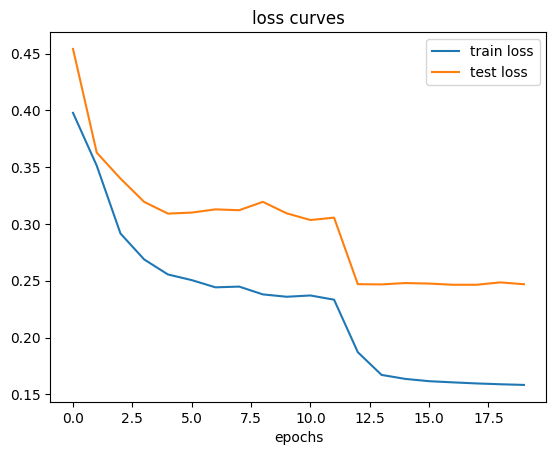

In [11]:
plt.plot(train_losses[::2])
plt.plot(test_losses)
plt.legend(["train loss", "test loss"])
plt.xlabel('epochs')
plt.title('loss curves')
plt.show()

In [12]:
from torch.utils.data import DataLoader, TensorDataset

test_loader = DataLoader(TensorDataset(torch.Tensor(X_train), torch.Tensor(X_train)), batch_size=1000, shuffle=False)

model.eval()

outputs = []
with torch.no_grad():
    for batch_x, batch_y in test_loader:
        output = model(batch_x.cuda()).detach().cpu().numpy()
        outputs.append(output)

outputs = np.concatenate(outputs, axis=0)
outputs.shape

(60000, 2)

In [13]:
outputs_normalised = normalise(outputs)
print(outputs_normalised.shape)

np.save("./umap_data_reducted_normalised_far20outof60.npy", np.hstack([outputs_normalised, np.array(y_train).reshape(-1,1)]))

(60000, 2)


In [15]:
draw_z(z=outputs_normalised, cls=torch.tensor(y_train), s=1, x_highlight=0.0, y_highlight=0.0)

<Figure size 15000x15000 with 0 Axes>

In [24]:
plt.scatter(outputs_normalised[y_train==0][:,0], outputs_normalised[y_train==0][:,1], s=1)

In [34]:
digit0 = outputs_normalised[y_train==0]
digit0 = digit0[(digit0[:,0]<0.7) & (digit0[:,0]>0.4) & (digit0[:,1]>0.0) & (digit0[:,1]<0.2)]
digit0

array([[0.5094745 , 0.11245854],
       [0.540092  , 0.09532479],
       [0.42215753, 0.16132174],
       ...,
       [0.48521063, 0.12603678],
       [0.48075032, 0.12853281],
       [0.53142667, 0.10017398]], dtype=float32)

In [40]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()

lr.fit(X=digit0[:,0].reshape(-1,1), y=digit0[:,1].reshape(-1,1))
lr.coef_, lr.intercept_

(array([[-0.55911136]], dtype=float32), array([0.39747122], dtype=float32))

In [41]:
xs = np.linspace(0.4, 0.6, 100)
ys = lr.coef_ * xs + lr.intercept_

In [45]:
# plt.scatter(digit0[:,0], digit0[:,1], s=1)

digit0 = outputs_normalised[y_train==0]
plt.scatter(digit0[:,0], digit0[:,1], s=1)
plt.scatter(xs, ys, s=1)
plt.legend(["DR", "LR"])
plt.show()

# paramUMAP

In [518]:
batch_size = 1000 # 1024

# construct graph of nearest neighbors
graph_constructor_train =  ConstructUMAPGraph(metric='euclidean', n_neighbors=20, batch_size=batch_size, random_state=42)
epochs_per_sample_train, head_train, tail_train, weight_train = graph_constructor_train(X_train)

graph_constructor_test =  ConstructUMAPGraph(metric='euclidean', n_neighbors=20, batch_size=batch_size, random_state=42)
epochs_per_sample_test, head_test, tail_test, weight_test = graph_constructor_test(X_test)

Mon Dec 11 23:09:17 2023 Building RP forest with 17 trees
Mon Dec 11 23:09:18 2023 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	 4  /  16
	Stopping threshold met -- exiting after 4 iterations
Mon Dec 11 23:09:20 2023 Building RP forest with 10 trees
Mon Dec 11 23:09:20 2023 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	 4  /  13
	Stopping threshold met -- exiting after 4 iterations


In [519]:
len(epochs_per_sample_train), len(epochs_per_sample_test)

(1671308, 273280)

In [521]:
graph_2 = graph_train.copy()
graph_2

<60000x60000 sparse matrix of type '<class 'numpy.float32'>'
	with 2016884 stored elements in COOrdinate format>

In [525]:
graph_1

<60000x60000 sparse matrix of type '<class 'numpy.float32'>'
	with 2016756 stored elements in COOrdinate format>

In [526]:
graph_1.tocsr()[0,:][np.nonzero(graph_1.tocsr()[0,:].toarray())]

matrix([[0.3950582 , 0.04870467, 0.02960103, 0.04102566, 0.05310133,
         0.06194015, 0.09397002, 0.71768403, 0.1439482 , 0.11887746,
         0.02167242, 0.07044201, 1.        , 0.11470751, 0.20994312,
         0.0336908 , 0.01796707, 0.02919682, 0.5617132 , 0.5869912 ,
         0.05159959]], dtype=float32)

In [527]:
graph_2.tocsr()[0,:][np.nonzero(graph_2.tocsr()[0,:].toarray())]

matrix([[0.3950582 , 0.04870467, 0.02960103, 0.04102566, 0.05310133,
         0.06194015, 0.09397002, 0.71768403, 0.1439482 , 0.11887746,
         0.02167242, 0.07044201, 1.        , 0.11470751, 0.20994312,
         0.0336908 , 0.01796707, 0.02919682, 0.5617132 , 0.5869912 ,
         0.05159959]], dtype=float32)

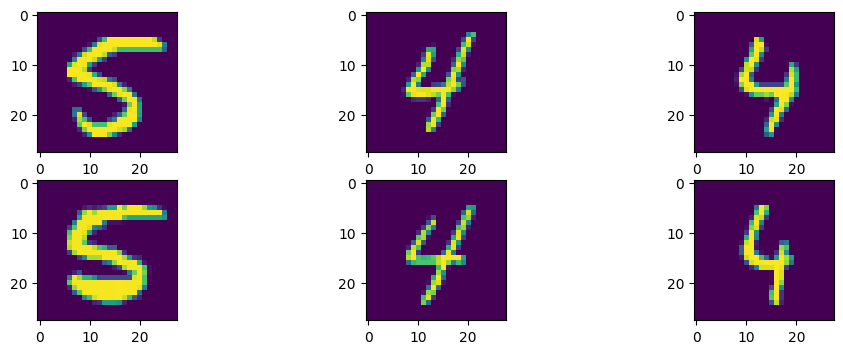

In [58]:
# # plot examples of nearest neighbors
# fig, ax = plt.subplots(2,3,figsize=(12,4))
# ids = np.random.randint(0, len(X_train), size=3)
# for j in range(3):
#     ax[0][j].imshow(X_train[head_train[ids[j]],0,:,:])
#     ax[1][j].imshow(X_train[tail_train[ids[j]],0,:,:])

In [470]:
train_dataset = UMAPDataset(
    data=X_train, labels=y_train, 
    epochs_per_sample=epochs_per_sample_train, head=head_train, tail=tail_train, weight=weight_train, 
    device='cuda', batch_size=batch_size, feedback=None
)
test_dataset = UMAPDataset(
    data=X_test, labels=y_test, 
    epochs_per_sample=epochs_per_sample_test, head=head_test, tail=tail_test, weight=weight_test, 
    device='cuda', batch_size=batch_size, feedback=None
)

criterion = UMAPLoss(device='cuda', min_dist=0.1, batch_size=batch_size, negative_sample_rate=5, edge_weight=None, repulsion_strength=1.0)

In [472]:
train_dataset.batches_per_epoch

1449